In [1]:
import cogsworth
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [59]:
%config InlineBackend.figure_format = 'retina'
plt.style.use("default")


pd.options.display.max_columns = 999

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.9 * fs,
          'ytick.labelsize': 0.9 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4}
plt.rcParams.update(params)

# Load this gargantuan population

~1:45 to load

In [3]:
p = cogsworth.pop.load("/mnt/home/twagg/ceph/pops/boundedness/alpha_1.0")

~3:30 to get

In [52]:
p.final_coords

(<SkyCoord (Galactocentric: galcen_coord=<ICRS Coordinate: (ra, dec) in deg
     (266.4051, -28.936175)>, galcen_distance=8.122 kpc, galcen_v_sun=(12.9, 245.6, 7.78) km / s, z_sun=20.8 pc, roll=0.0 deg): (x, y, z) in kpc
     [(10.8680901 , -1.92325908, 0.81217484),
      (10.86930106, -1.92227001, 0.81061863),
      (10.86784283, -1.92182587, 0.8109989 ), ...,
      (-6.32592543, -4.79847011, 0.30821147),
      (-6.31973817, -4.76024648, 0.37106228),
      (-6.37324623, -4.72317833, 0.33786697)]
  (v_x, v_y, v_z) in km / s
     [(15.33432931,  85.78021912, 51.95291733),
      (18.64343067,  84.50283814, 49.3054684 ),
      (21.70590563,  83.93261227, 55.40922799), ...,
      (42.91169271, -94.99834754, 14.71100155),
      (43.06362993, -94.50109897, 15.32804683),
      (42.28477973, -94.09578083, 14.99324973)]>,
 <SkyCoord (Galactocentric: galcen_coord=<ICRS Coordinate: (ra, dec) in deg
     (266.4051, -28.936175)>, galcen_distance=8.122 kpc, galcen_v_sun=(12.9, 245.6, 7.78) km / s, z

In [5]:
f'Total mass of sim: {(p.mass_binaries + p.mass_singles) * u.Msun:1.3e}'

'Total mass of sim: 1.017e+08 solMass'

# Spatial distributions

## Initial

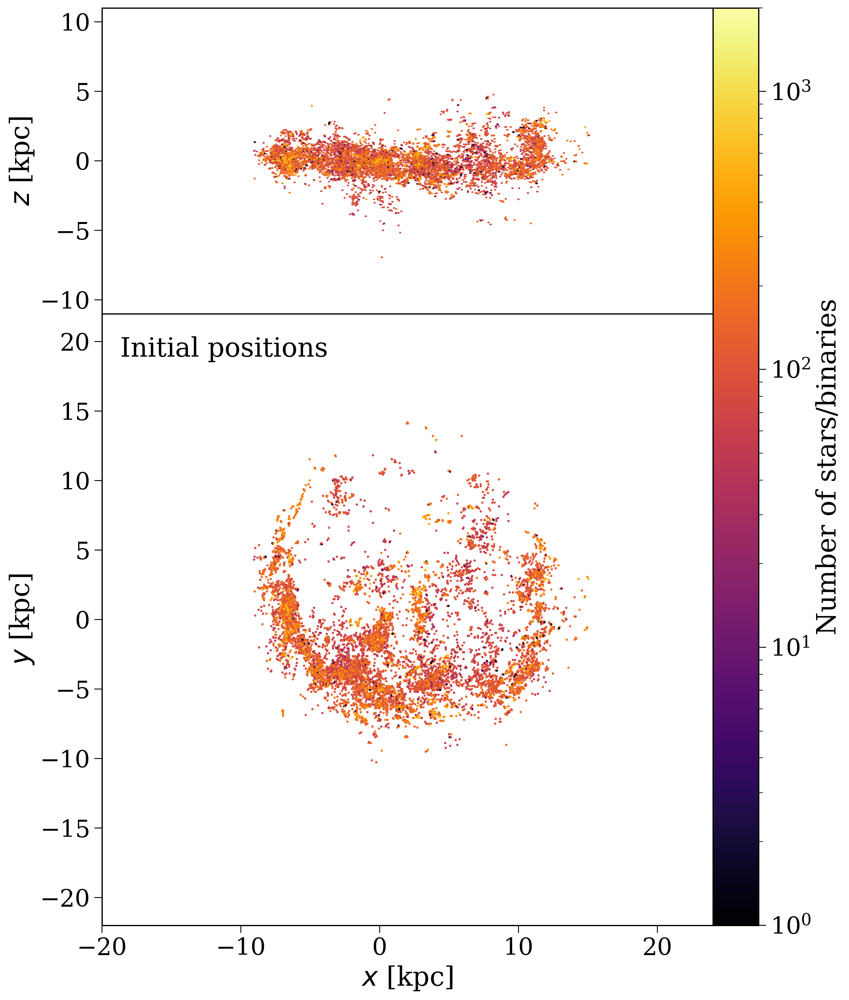

In [7]:
fig, axes = plt.subplots(2, 1, figsize=(14, 15), gridspec_kw={"height_ratios": [1, 2]}, sharex=True)
fig.subplots_adjust(hspace=0)

hexbin = axes[0].hexbin(p.initial_galaxy.positions.x, p.initial_galaxy.positions.z,
                        extent=(-18, 22, -10, 10), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=2e3)
hexbin = axes[1].hexbin(p.initial_galaxy.positions.x, p.initial_galaxy.positions.y,
                        extent=(-18, 22, -20, 20), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=2e3)

for ax in axes:
    ax.set_aspect("equal")

fig.colorbar(hexbin, label="Number of stars/binaries", ax=axes, pad=0.0)

axes[0].set_ylabel("$z$ [kpc]")
axes[1].set_xlabel("$x$ [kpc]")
axes[1].set_ylabel("$y$ [kpc]")

axes[1].annotate("Initial positions", xy=(0.03, 0.93), xycoords="axes fraction", fontsize=fs)

plt.show()

## Final

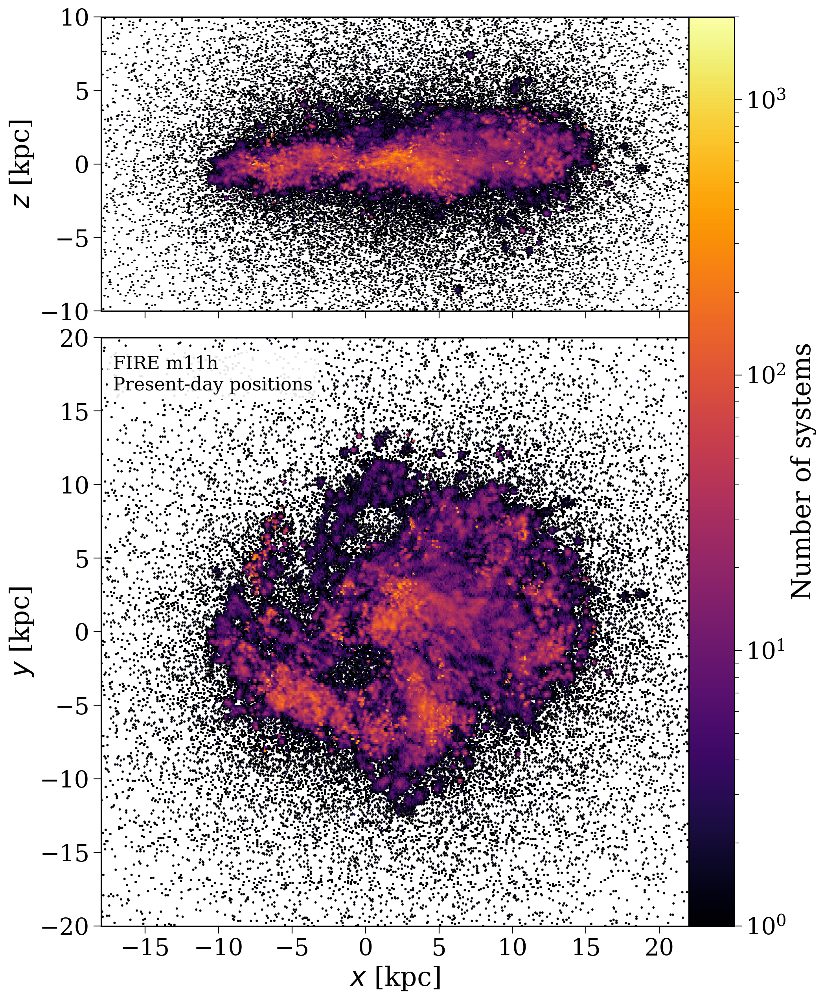

In [69]:

fig, axes = plt.subplots(2, 1, figsize=(14, 15), gridspec_kw={"height_ratios": [1, 2]}, sharex=True)
fig.subplots_adjust(hspace=0.06)

hexbin = axes[0].hexbin(np.concatenate((p.final_coords[0].x.value, p.final_coords[1][p.disrupted].x.value)),
                        np.concatenate((p.final_coords[0].z.value, p.final_coords[1][p.disrupted].z.value)),
                        extent=(-18, 22, -10, 10), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=2e3,
                        rasterized=True)
hexbin = axes[1].hexbin(np.concatenate((p.final_coords[0].x.value, p.final_coords[1][p.disrupted].x.value)),
                        np.concatenate((p.final_coords[0].y.value, p.final_coords[1][p.disrupted].y.value)),
                        extent=(-18, 22, -20, 20), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=2e3,
                        rasterized=True)

for ax in axes:
    ax.set_aspect("equal")
    ax.set_xlim(-18, 22)

fig.colorbar(hexbin, label="Number of systems", ax=axes, pad=0.0)

axes[0].set_ylabel("$z$ [kpc]")
axes[1].set_xlabel("$x$ [kpc]")
axes[1].set_ylabel("$y$ [kpc]")

axes[0].set_ylim(-10, 10)
axes[1].set_ylim(-20, 20)

axes[1].annotate("FIRE m11h\nPresent-day positions", xy=(0.02, 0.97), xycoords="axes fraction", fontsize=0.7*fs, bbox=dict(facecolor='white', alpha=0.9, edgecolor="white"), va="top")

plt.savefig("FIRE_final.pdf", format="pdf", bbox_inches="tight", dpi=400)

plt.show()

## Split by kicks

In [4]:
was_kicked = (p.bpp["evol_type"] == 15) | (p.bpp["evol_type"] == 16)
kicked_bin_nums = p.bpp["bin_num"][was_kicked].values

In [5]:
kicked_mask = np.isin(p.bin_nums, kicked_bin_nums)

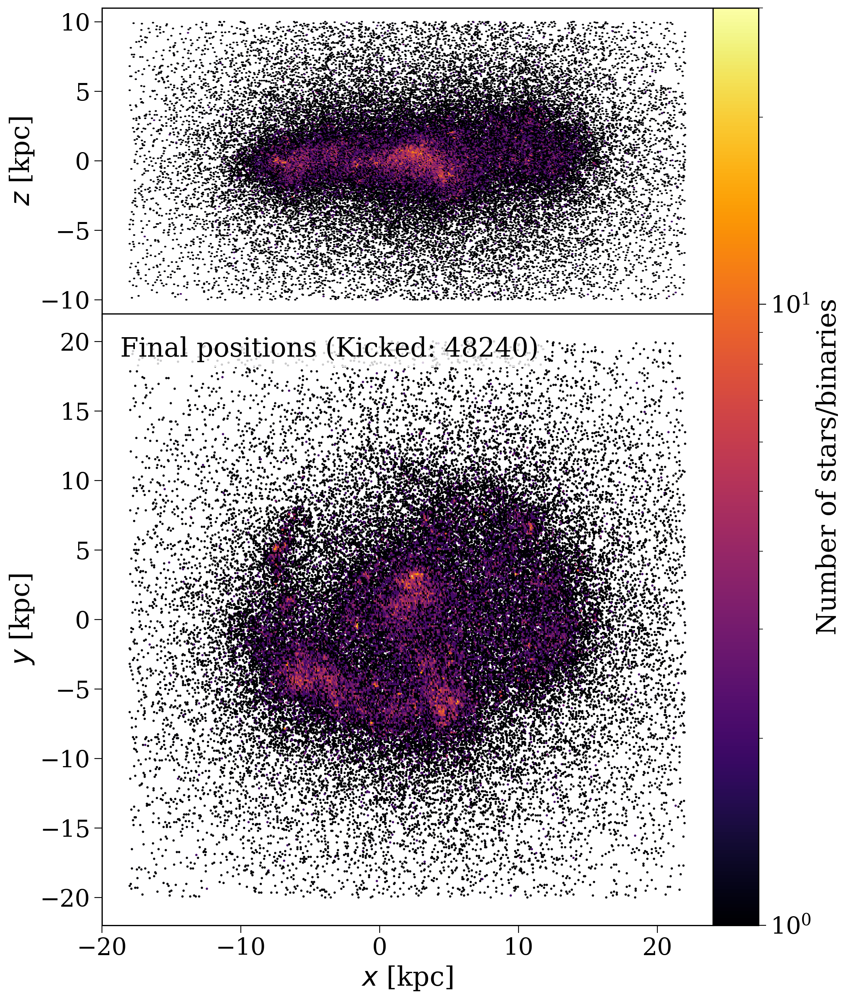

In [40]:

fig, axes = plt.subplots(2, 1, figsize=(14, 15), gridspec_kw={"height_ratios": [1, 2]}, sharex=True)
fig.subplots_adjust(hspace=0)

hexbin = axes[0].hexbin(np.concatenate((p.final_coords[0].x.value[kicked_mask], p.final_coords[1][kicked_mask].x.value)),
                        np.concatenate((p.final_coords[0].z.value[kicked_mask], p.final_coords[1][kicked_mask].z.value)),
                        extent=(-18, 22, -10, 10), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=3e1)
hexbin = axes[1].hexbin(np.concatenate((p.final_coords[0].x.value[kicked_mask], p.final_coords[1][kicked_mask].x.value)),
                        np.concatenate((p.final_coords[0].y.value[kicked_mask], p.final_coords[1][kicked_mask].y.value)),
                        extent=(-18, 22, -20, 20), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=3e1)

for ax in axes:
    ax.set_aspect("equal")

fig.colorbar(hexbin, label="Number of stars/binaries", ax=axes, pad=0.0)

axes[0].set_ylabel("$z$ [kpc]")
axes[1].set_xlabel("$x$ [kpc]")
axes[1].set_ylabel("$y$ [kpc]")

axes[1].annotate(f"Final positions (Kicked: {kicked_mask.sum()})", xy=(0.03, 0.93), xycoords="axes fraction", fontsize=fs, bbox=dict(facecolor='white', alpha=0.8, edgecolor="white"))

plt.show()

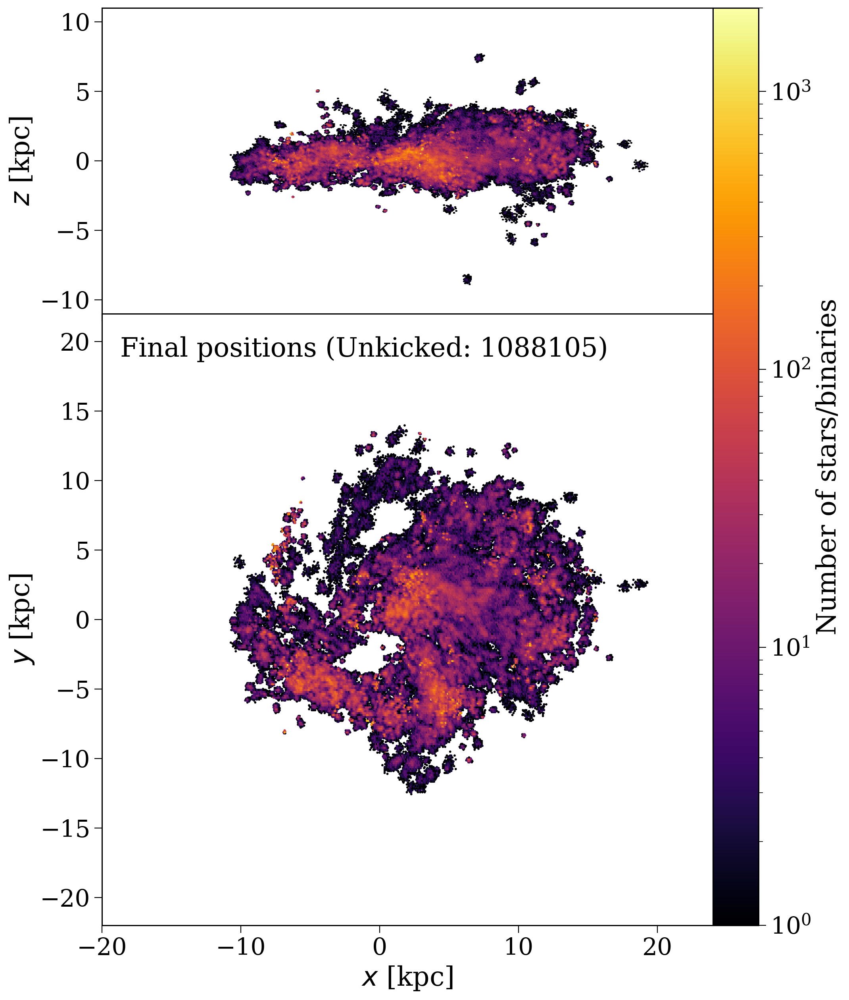

In [12]:

fig, axes = plt.subplots(2, 1, figsize=(14, 15), gridspec_kw={"height_ratios": [1, 2]}, sharex=True)
fig.subplots_adjust(hspace=0)

hexbin = axes[0].hexbin(p.final_coords[0].x.value[~kicked_mask],
                        p.final_coords[0].z.value[~kicked_mask],
                        extent=(-18, 22, -10, 10), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=2e3)
hexbin = axes[1].hexbin(p.final_coords[0].x.value[~kicked_mask],
                        p.final_coords[0].y.value[~kicked_mask],
                        extent=(-18, 22, -20, 20), bins="log", gridsize=500, cmap="inferno", vmin=1, vmax=2e3)

for ax in axes:
    ax.set_aspect("equal")

fig.colorbar(hexbin, label="Number of stars/binaries", ax=axes, pad=0.0)

axes[0].set_ylabel("$z$ [kpc]")
axes[1].set_xlabel("$x$ [kpc]")
axes[1].set_ylabel("$y$ [kpc]")

axes[1].annotate(f"Final positions (Unkicked: {(~kicked_mask).sum()})", xy=(0.03, 0.93), xycoords="axes fraction", fontsize=fs, bbox=dict(facecolor='white', alpha=0.8, edgecolor="white"))

plt.show()

### Ratios

In [13]:
kicked_x = np.concatenate((p.final_coords[0].x.value[kicked_mask], p.final_coords[1][kicked_mask].x.value))
kicked_y = np.concatenate((p.final_coords[0].y.value[kicked_mask], p.final_coords[1][kicked_mask].y.value))
kicked_z = np.concatenate((p.final_coords[0].z.value[kicked_mask], p.final_coords[1][kicked_mask].z.value))

unkicked_x = p.final_coords[0].x.value[~kicked_mask]
unkicked_y = p.final_coords[0].y.value[~kicked_mask]
unkicked_z = p.final_coords[0].z.value[~kicked_mask]

In [23]:
ratio_bins = 150

H_kicked_z, _, _ = np.histogram2d(kicked_x, kicked_z, bins=ratio_bins, range=[[-18, 22], [-10, 10]])
H_kicked_y, _, _ = np.histogram2d(kicked_x, kicked_y, bins=ratio_bins, range=[[-18, 22], [-20, 20]])

H_unkicked_z, _, _ = np.histogram2d(unkicked_x, unkicked_z, bins=ratio_bins, range=[[-18, 22], [-10, 10]])
H_unkicked_y, _, _ = np.histogram2d(unkicked_x, unkicked_y, bins=ratio_bins, range=[[-18, 22], [-20, 20]])

/tmp/ipykernel_1332098/2240082350.py:4: RuntimeWarning: divide by zero encountered in divide
  im = axes[0].imshow(H_kicked_z / (H_kicked_z + H_unkicked_z).T, origin="lower", extent=[-18, 22, -10, 10], cmap="viridis_r", norm="log", vmin=1e-3, vmax=1e0)
/tmp/ipykernel_1332098/2240082350.py:4: RuntimeWarning: invalid value encountered in divide
  im = axes[0].imshow(H_kicked_z / (H_kicked_z + H_unkicked_z).T, origin="lower", extent=[-18, 22, -10, 10], cmap="viridis_r", norm="log", vmin=1e-3, vmax=1e0)
/tmp/ipykernel_1332098/2240082350.py:5: RuntimeWarning: divide by zero encountered in divide
  im = axes[1].imshow(H_kicked_y / (H_kicked_y + H_unkicked_y).T, origin="lower", extent=[-18, 22, -20, 20], cmap="viridis_r", norm="log", vmin=1e-3, vmax=1e0)
/tmp/ipykernel_1332098/2240082350.py:5: RuntimeWarning: invalid value encountered in divide
  im = axes[1].imshow(H_kicked_y / (H_kicked_y + H_unkicked_y).T, origin="lower", extent=[-18, 22, -20, 20], cmap="viridis_r", norm="log", vmin=1e-3, 

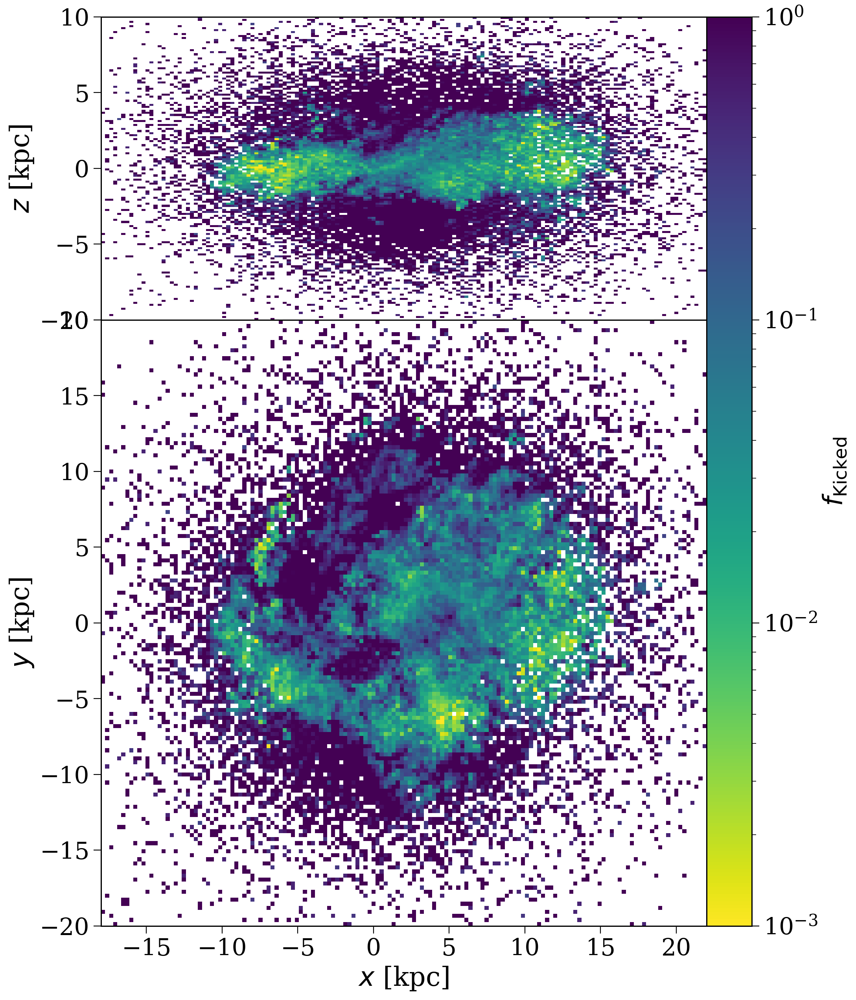

In [38]:
fig, axes = plt.subplots(2, 1, figsize=(14, 15), gridspec_kw={"height_ratios": [1, 2]}, sharex=True)
fig.subplots_adjust(hspace=0)

im = axes[0].imshow(H_kicked_z / (H_kicked_z + H_unkicked_z).T, origin="lower", extent=[-18, 22, -10, 10], cmap="viridis_r", norm="log", vmin=1e-3, vmax=1e0)
im = axes[1].imshow(H_kicked_y / (H_kicked_y + H_unkicked_y).T, origin="lower", extent=[-18, 22, -20, 20], cmap="viridis_r", norm="log", vmin=1e-3, vmax=1e0)
# fig.colorbar(im, label=r"$f_\mathrm{Kicked}$", ax=axes, pad=0.0)
fig.colorbar(im, label=r"Fraction that received a supernova kick", ax=axes, pad=0.0)

for ax in axes:
    ax.set_aspect("equal")
    
axes[0].set_ylabel("$z$ [kpc]")
axes[1].set_xlabel("$x$ [kpc]")
axes[1].set_ylabel("$y$ [kpc]")

plt.show()

# Orbits

In [6]:
one_particle = (p.initC["particle_id"] == 6000).values

In [7]:
p_osp = p[one_particle]

In [8]:
import pandas as pd

In [9]:
star_particles = pd.read_hdf("FIRE_star_particles.h5")

In [10]:
import gala.dynamics as gd

In [11]:
particle_orbits = [None for _ in range(len(star_particles))]
for i in range(len(star_particles)):
    if i % 1000 == 0:
        print(i)
    w0 = gd.PhaseSpacePosition(pos=star_particles.iloc[i][["x", "y", "z"]].values * u.kpc,
                            vel=star_particles.iloc[i][["v_x", "v_y", "v_z"]].values * u.km / u.s)
    min_dt = (p.max_ev_time - star_particles.iloc[i]["t_form"] * u.Gyr).to(u.Myr).value
    if min_dt <= 0.01:
        continue
    particle_orbits[i] = p.galactic_potential.integrate_orbit(w0,
                                                              t1=star_particles.iloc[i]["t_form"] * u.Gyr,
                                                              t2=p.max_ev_time, dt=min(min_dt - 0.01, 1) * u.Myr)

0
1000
2000
3000
4000
5000
6000
7000
8000
9000


In [8]:
sn_rows = p.bpp.loc[kicked_bin_nums][(p.bpp.loc[kicked_bin_nums]["evol_type"] == 15) | (p.bpp.loc[kicked_bin_nums]["evol_type"] == 16)]

In [36]:
sn_distances = np.zeros(len(kicked_bin_nums)) * u.kpc
child_orbits = p.orbits[kicked_mask]
parent_orbits = particle_orbits[p.initC.loc[kicked_bin_nums]["particle_id"].values]
for i in range(len(kicked_bin_nums)):
    parent_orbit = parent_orbits[i]
    child_orbit = child_orbits[i]
    if isinstance(child_orbit, list):
        child_orbit = child_orbit[0]

    sn_time = sn_rows["tphys"].iloc[i]

    parent_pos = parent_orbit.pos[np.argmin(abs(parent_orbit.t - (sn_time * u.Myr + parent_orbit.t[0])))]
    child_pos = child_orbit.pos[np.argmin(abs(child_orbit.t - (sn_time * u.Myr + child_orbit.t[0])))]

    sn_distances[i] = sum((parent_pos - child_pos).xyz**2)**(0.5)

In [45]:
sn_distances_hists = [sn_distances[(p.initC.loc[kicked_bin_nums]["mass_1"].values <= 15)], sn_distances[(p.initC.loc[kicked_bin_nums]["mass_1"].values > 15)]]

In [114]:
star_particles.sort_values("t_form")["mass"].cumsum().values

array([1.11329004e+04, 2.08887978e+04, 2.98696038e+04, ...,
       1.01650008e+08, 1.01662791e+08, 1.01674856e+08])

16265
11154
10571
5873
4377


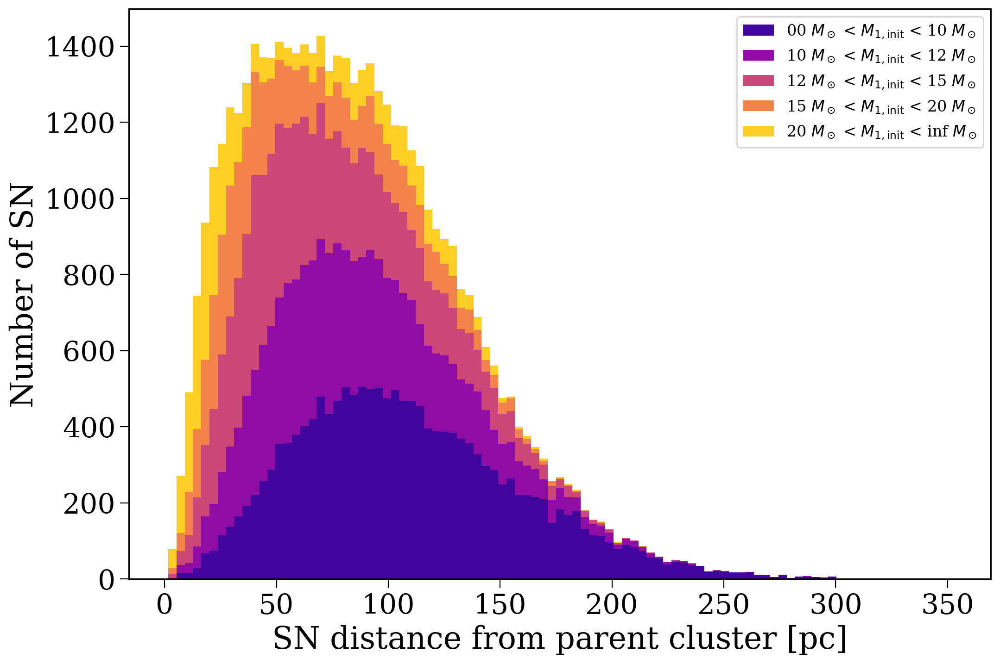

In [106]:
mass_ranges = [(0, 10), (10, 12), (12, 15), (15, 20), (20, np.inf)]
mass_1_kicked = p.initC.loc[kicked_bin_nums]["mass_1"].values
sn_distances_hists = [sn_distances[(mass_1_kicked >= m_low) & (mass_1_kicked < m_high)].to(u.pc) for m_low, m_high in mass_ranges]

for x in sn_distances_hists:
    print(len(x))

labels = [f"{m_low:02d} $M_\odot$ < $M_{{1, \\rm init}}$ < {m_high} $M_\odot$" for m_low, m_high in mass_ranges]

plt.hist(sn_distances_hists, stacked=True, bins="fd", label=labels,
         color=plt.cm.plasma(np.linspace(0.1, 0.9, len(mass_ranges))));
plt.xlabel("SN distance from parent cluster [pc]")
plt.ylabel("Number of SN")
plt.legend(fontsize=0.5*fs)
plt.show()

Text(0, 0.5, 'Number of star particles')

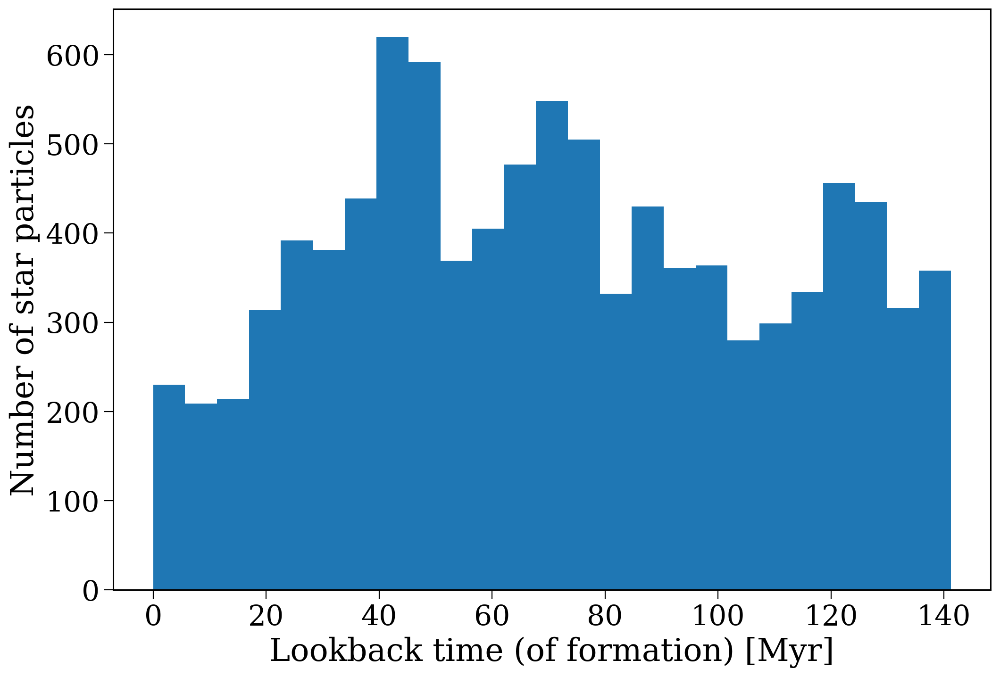

In [102]:
plt.hist(-(star_particles["t_form"] - star_particles["t_form"].max()) * 1000, bins="fd");
plt.xlabel("Lookback time (of formation) [Myr]")
plt.ylabel("Number of star particles")

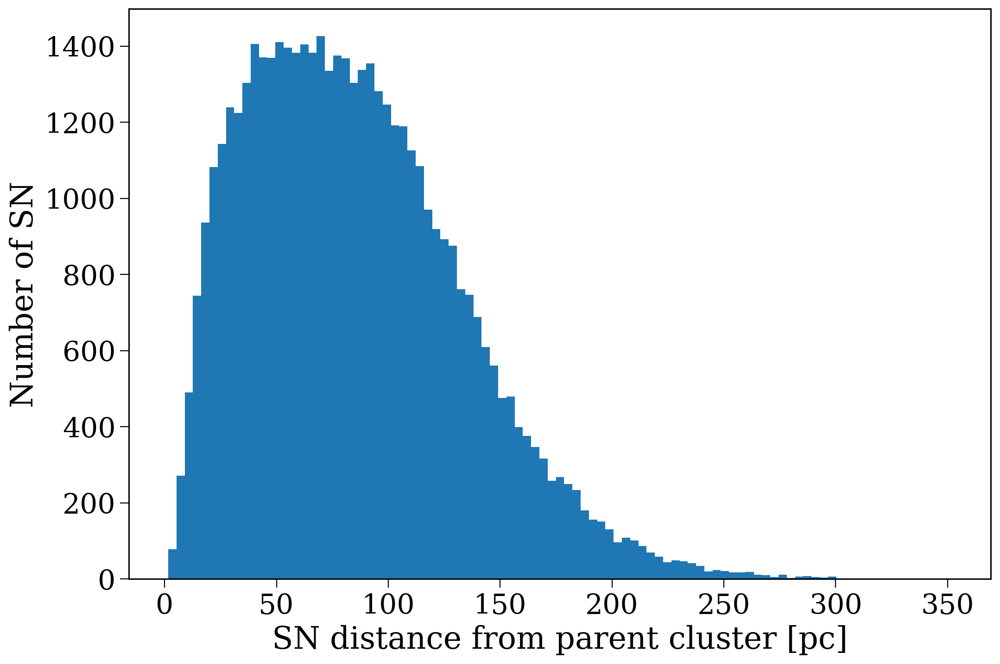

In [37]:
plt.hist(sn_distances[sn_distances > 0 * u.kpc].to(u.pc), bins="fd");
plt.xlabel("SN distance from parent cluster [pc]")
plt.ylabel("Number of SN")
plt.show()

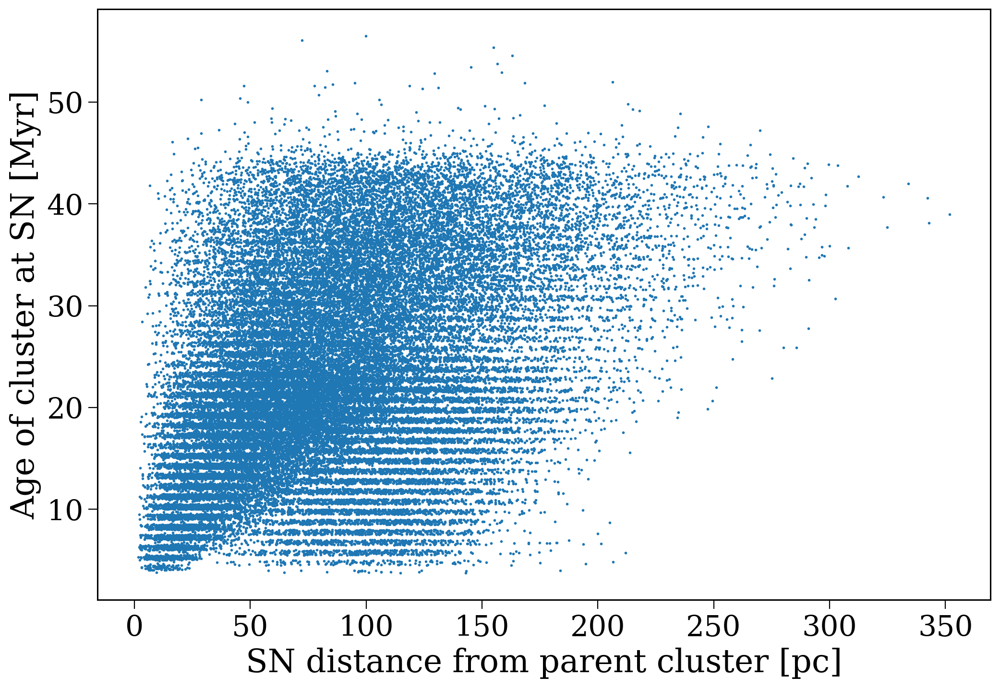

In [150]:
plt.scatter(sn_distances.to(u.pc), sn_rows["tphys"].values, s=1);
plt.xlabel("SN distance from parent cluster [pc]")
plt.ylabel("Age of cluster at SN [Myr]")
plt.show()

In [12]:
def add_stars(ax, starsurfacedensity=0.8, lw=1):
    starcolor = (1.,1.,1.)
    area = np.sqrt(np.sum(np.square(ax.transAxes.transform([1.,1.]) - ax.transAxes.transform([0.,0.]))))*1
    nstars = int(starsurfacedensity*area)

    #small stars
    xy = np.random.uniform(size=(nstars,2))
    ax.scatter(xy[:,0],xy[:,1], transform=ax.transAxes, alpha=0.05, s=8*lw, facecolor=starcolor, edgecolor=None, zorder=3, rasterized=True)
    ax.scatter(xy[:,0],xy[:,1], transform=ax.transAxes, alpha=0.1, s=4*lw, facecolor=starcolor, edgecolor=None, zorder=3, rasterized=True)
    ax.scatter(xy[:,0],xy[:,1], transform=ax.transAxes, alpha=0.2, s=0.5*lw, facecolor=starcolor, edgecolor=None, zorder=3, rasterized=True)

    #large stars
    xy = np.random.uniform(size=(nstars//4,2))
    ax.scatter(xy[:,0],xy[:,1], transform=ax.transAxes, alpha=0.1, s=15*lw, facecolor=starcolor, edgecolor=None, zorder=3, rasterized=True)
    ax.scatter(xy[:,0],xy[:,1], transform=ax.transAxes, alpha=0.1, s=5*lw, facecolor=starcolor, edgecolor=None, zorder=3, rasterized=True)
    ax.scatter(xy[:,0],xy[:,1], transform=ax.transAxes, alpha=0.5, s=2*lw, facecolor=starcolor, edgecolor=None, zorder=3, rasterized=True)

In [13]:
from matplotlib.collections import LineCollection

In [14]:
from matplotlib.lines import Line2D

In [15]:
from matplotlib.legend_handler import HandlerLineCollection
from matplotlib.collections import LineCollection

class HandlerColorLineCollection(HandlerLineCollection):
    def create_artists(self, legend, artist ,xdescent, ydescent,
                        width, height, fontsize,trans):
        x = np.linspace(0,width,self.get_numpoints(legend)+1)
        y = np.zeros(self.get_numpoints(legend)+1)+height/2.-ydescent
        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)
        lc = LineCollection(segments, cmap=artist.cmap,
                            transform=trans, colors=[f'C{i}' for i in range(self.get_numpoints(legend))])
        lc.set_array(x)
        lc.set_linewidth(artist.get_linewidth())
        return [lc]

In [33]:
p.orbits[p.bin_nums == 1344508][0][0].t

<Quantity [13611.87164369, 13612.87164369, 13613.87164369, 13614.87164369,
           13615.87164369, 13616.87164369, 13617.87164369, 13618.87164369,
           13619.87164369, 13620.87164369, 13621.87164369, 13622.87164369,
           13623.87164369, 13624.87164369, 13625.87164369, 13626.87164369,
           13627.87164369, 13628.87164369, 13629.87164369, 13630.87164369,
           13631.87164369, 13632.87164369, 13633.87164369, 13634.87164369,
           13635.87164369, 13636.87164369, 13637.87164369, 13638.87164369,
           13639.87164369, 13640.87164369, 13641.87164369, 13642.87164369,
           13643.87164369, 13644.87164369, 13645.87164369, 13646.87164369,
           13647.87164369, 13648.87164369, 13649.87164369, 13650.87164369,
           13651.87164369, 13652.87164369, 13653.87164369, 13654.87164369,
           13655.87164369, 13656.87164369, 13657.87164369, 13658.87164369,
           13659.87164369, 13660.87164369, 13661.87164369, 13662.87164369,
           13663.87164369

In [25]:
p_osp.bin_nums[p_osp.disrupted]

array([1344508, 1344520, 1344540, 1344544])

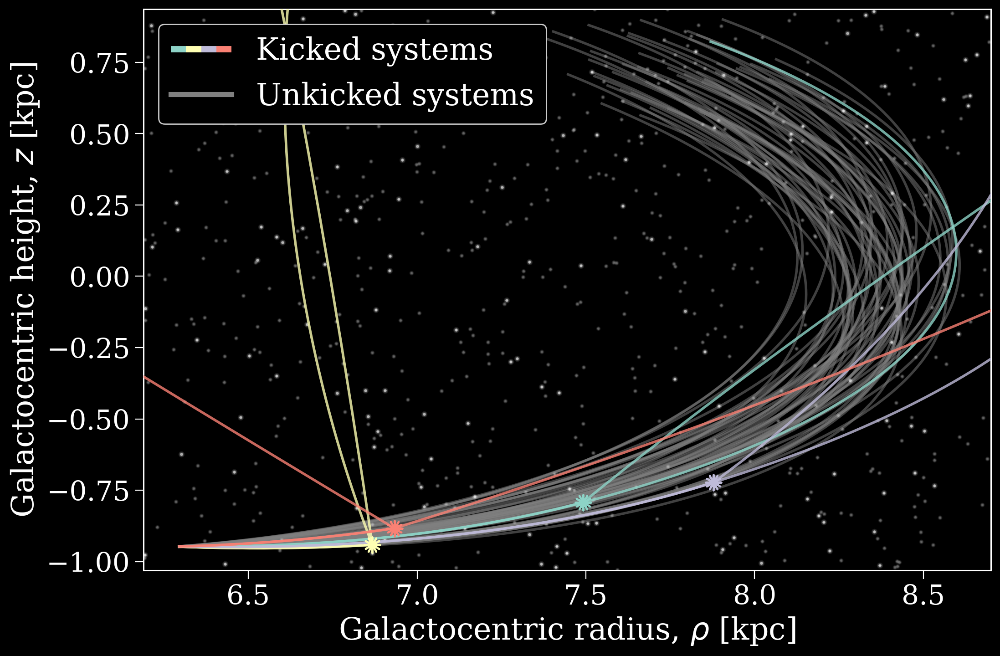

In [51]:
plt.style.use("dark_background")

fig, ax = plt.subplots()
cluster_style = {
    "color": "grey",
    "zorder": -1,
    "linestyle": "-",
    "alpha": 0.5,
    "autolim": True,
    "lw": 2,
    "rasterized": True
}
supernova_style = {
    "color": None,
    "zorder": 4,
    "linestyle": "-",
    "alpha": 0.8,
    "autolim": False,
    "lw": 2
}
companion_style = {
    "color": None,
    "zorder": 4,
    "linestyle": "-",
    "alpha": 0.8,
    "autolim": False,
    "lw": 2
}


for bin_num, orbit in zip(p_osp.bin_nums, p_osp.orbits):
    style = supernova_style if bin_num in kicked_bin_nums else cluster_style

    if isinstance(orbit, list):
        orbit[0].cylindrical.plot(["rho", "z"], axes=ax, **style);

        companion_style["color"] = ax.lines[-1].get_color()
        orbit[1].cylindrical.plot(["rho", "z"], axes=ax, **companion_style);
    
        bpp_rows = p_osp.bpp.loc[bin_num]
        t_SN = bpp_rows[bpp_rows["evol_type"] == 15]["tphys"].values[0]
        ind_SN = np.argmin(np.abs(orbit[0].t - orbit[0].t[0] - t_SN * u.Myr))

        ax.scatter(orbit[0].cylindrical.rho[ind_SN], orbit[0].cylindrical.z[ind_SN], s=150, zorder=5, marker=(12, 2, 0))

    else:
        orbit.cylindrical.plot(["rho", "z"], axes=ax, **style);


add_stars(ax, starsurfacedensity=0.5)

# ax.plot(particle_orbits[6000].cylindrical.rho, particle_orbits[6000].cylindrical.z, color="black", lw=3)

# ax.set_xlim(0, 20)
# ax.set_ylim(-10, 10)

ax.set_xlabel(r"Galactocentric radius, $\rho$ [kpc]")
ax.set_ylabel(r"Galactocentric height, $z$ [kpc]")
ax.set_xlim(right=8.7)

lc = LineCollection([[[i / 4, 0], [(i + 1) / 4, 0]] for i in range(4)], linewidths=5)

ax.legend(handles=[lc,
                   Line2D([0], [0], color='grey', lw=4)], labels=["Kicked systems", "Unkicked systems"],
                   handler_map={lc: HandlerColorLineCollection(numpoints=4)}, framealpha=1.0, loc="upper left")

plt.savefig("orbits_example.pdf", format="pdf", bbox_inches="tight")

plt.show()

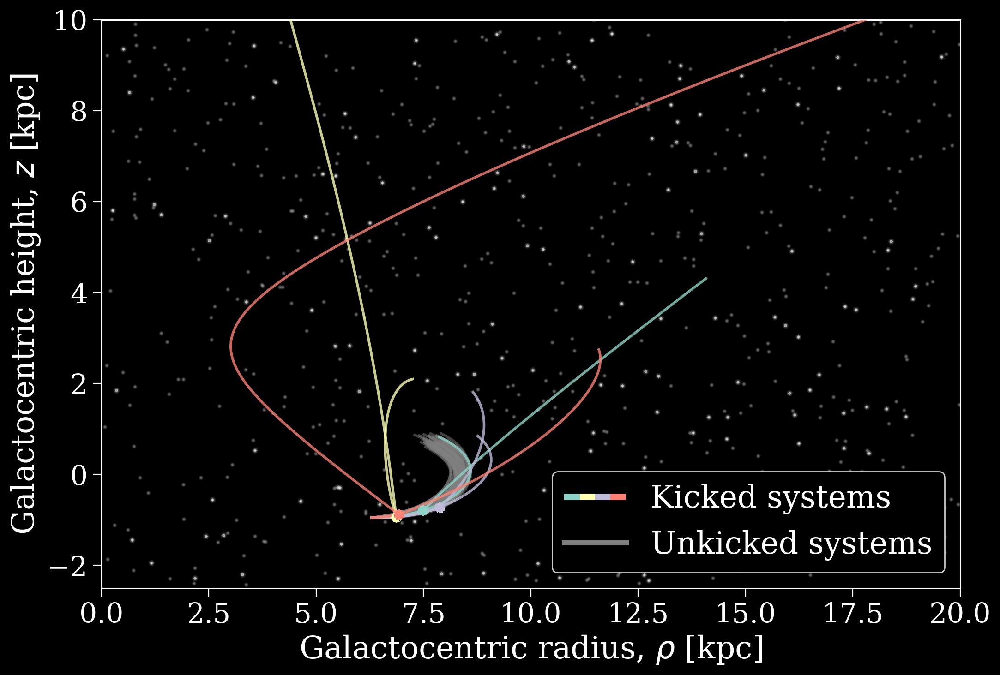

In [49]:
plt.style.use("dark_background")

fig, ax = plt.subplots()
cluster_style = {
    "color": "grey",
    "zorder": -1,
    "linestyle": "-",
    "alpha": 0.5,
    "autolim": True,
    "lw": 2
}
supernova_style = {
    "color": None,
    "zorder": 4,
    "linestyle": "-",
    "alpha": 0.8,
    "autolim": False,
    "lw": 2
}
companion_style = {
    "color": None,
    "zorder": 4,
    "linestyle": "-",
    "alpha": 0.8,
    "autolim": False,
    "lw": 2
}


for bin_num, orbit in zip(p_osp.bin_nums, p_osp.orbits):
    style = supernova_style if bin_num in kicked_bin_nums else cluster_style

    if isinstance(orbit, list):
        orbit[0].cylindrical.plot(["rho", "z"], axes=ax, **style);

        companion_style["color"] = ax.lines[-1].get_color()
        orbit[1].cylindrical.plot(["rho", "z"], axes=ax, **companion_style);
    
        bpp_rows = p_osp.bpp.loc[bin_num]
        t_SN = bpp_rows[bpp_rows["evol_type"] == 15]["tphys"].values[0]
        ind_SN = np.argmin(np.abs(orbit[0].t - orbit[0].t[0] - t_SN * u.Myr))

        ax.scatter(orbit[0].cylindrical.rho[ind_SN], orbit[0].cylindrical.z[ind_SN], s=50, zorder=5, marker=(12, 2, 0))

    else:
        orbit.cylindrical.plot(["rho", "z"], axes=ax, **style);


add_stars(ax, starsurfacedensity=0.5)

# ax.plot(particle_orbits[6000].cylindrical.rho, particle_orbits[6000].cylindrical.z, color="black", lw=3)

ax.set_xlim(0, 20)
ax.set_ylim(-2.5, 10)

ax.set_xlabel(r"Galactocentric radius, $\rho$ [kpc]")
ax.set_ylabel(r"Galactocentric height, $z$ [kpc]")
# ax.set_xlim(right=8.7)

lc = LineCollection([[[i / 4, 0], [(i + 1) / 4, 0]] for i in range(4)], linewidths=5)

ax.legend(handles=[lc,
                   Line2D([0], [0], color='grey', lw=4)], labels=["Kicked systems", "Unkicked systems"],
                   handler_map={lc: HandlerColorLineCollection(numpoints=4)}, framealpha=1.0, loc="lower right")


plt.show()

In [90]:
p.orbits

array([<Orbit cartesian, dim=3, shape=(1,)>,
       <Orbit cartesian, dim=3, shape=(1,)>,
       <Orbit cartesian, dim=3, shape=(1,)>, ...,
       <Orbit cartesian, dim=3, shape=(63,)>,
       <Orbit cartesian, dim=3, shape=(63,)>,
       <Orbit cartesian, dim=3, shape=(63,)>], dtype=object)

# Demographics

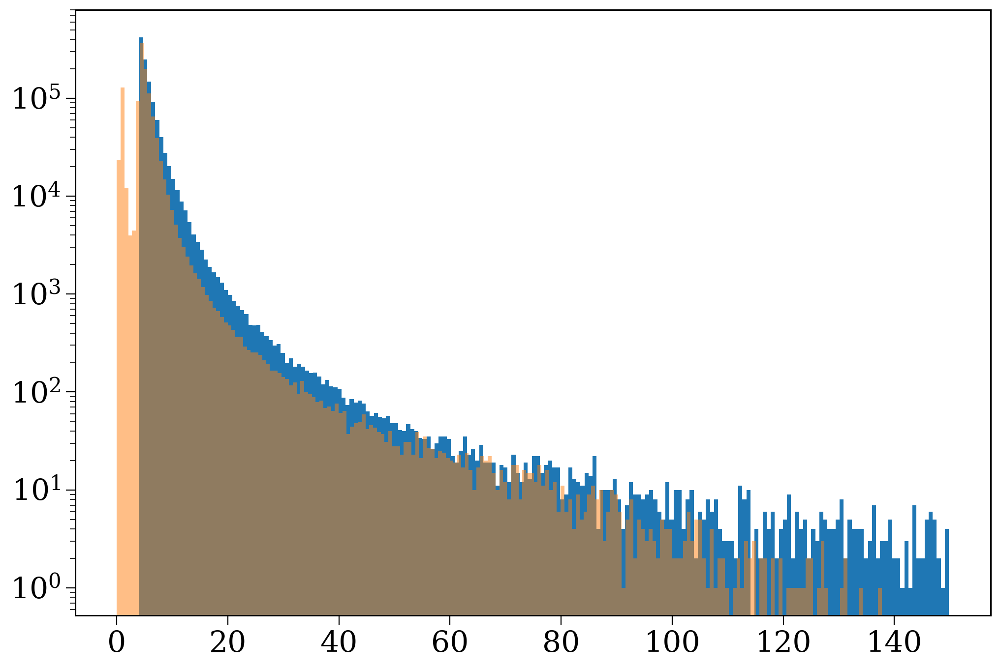

In [ ]:
plt.hist(p.initC["mass_1"], bins=200, log=True);
plt.hist(p.final_bpp["mass_1"], bins=200, log=True, alpha=0.5);